# READ LOL POSTMATCH LOBBY INFORMATION

The objective of this project is to extract comprehensive information from a photograph of a post-lobby match in the popular game of League of Legends. The photographs follow a consistent format:

<img src="ipynb_photos\default.png">

In the given photo, there exists a plethora of information. However, we aim to extract only the relevant information pertaining to each player, which includes the following:

* Player name
* Role
* Champion played by the player
* Level
* Player kill-death-assist ratio (KDA)
* Damage dealt
* Total gold earned
* Player's items



## IMPLEMENTATION

### Player Class
Firstly, we define the "Player" class which serves to store all the relevant data extracted from the post lobby match photo.

In [5]:
class Player:
    def __init__(self):
        pass

    def to_json(self):
        # Return player data as a dictionary
        return {
            'role': self.role,
            'username': self.username,
            'champion': self.champion,
            'lvl': self.lvl,
            'kda': self.kda,
            'dmg': self.dmg,
            'gold': self.gold,
            'items': self.items,
        }

### Crop image

In order to extract all the necessary information, we need to preprocess the input image by removing unnecessary parts and transforming it into an array of 10 images with a specific format.

<img src="ipynb_photos\cropped.png">

And then crop each element in small images:

<img src="ipynb_photos\lvl.png">
<img src="ipynb_photos\username_and_champion.png">
<img src="ipynb_photos\kda.png">
<img src="ipynb_photos\gold.png">
<img src="ipynb_photos\dmg.png">

(role is obtained by the player order, it is always the same: top -> jgl -> mid -> adc -> supp)


Input image:


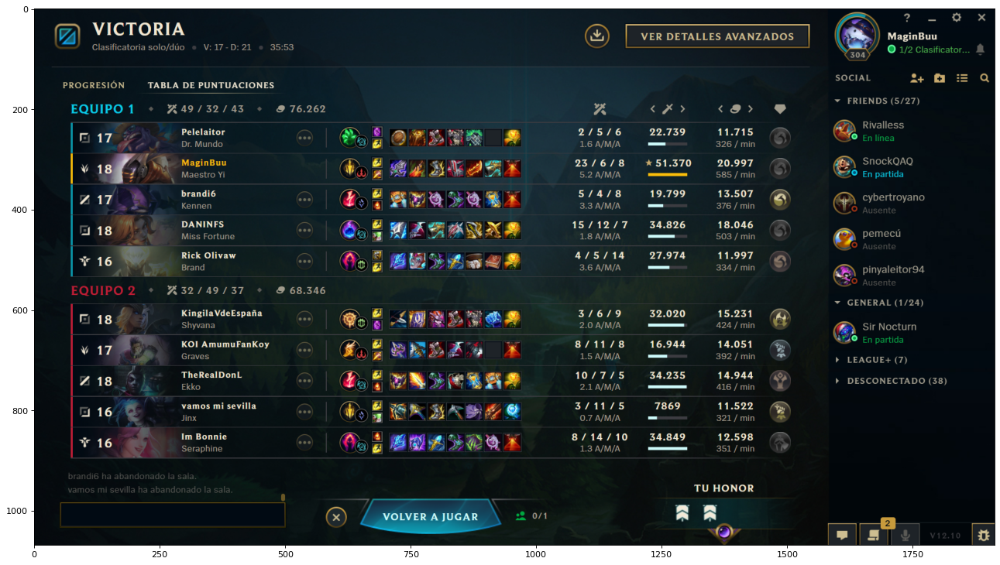

To begin, the image is cropped to remove the left padding:


The red color belonging to the enemies in the image is utilized to determine the starting point of the player information.


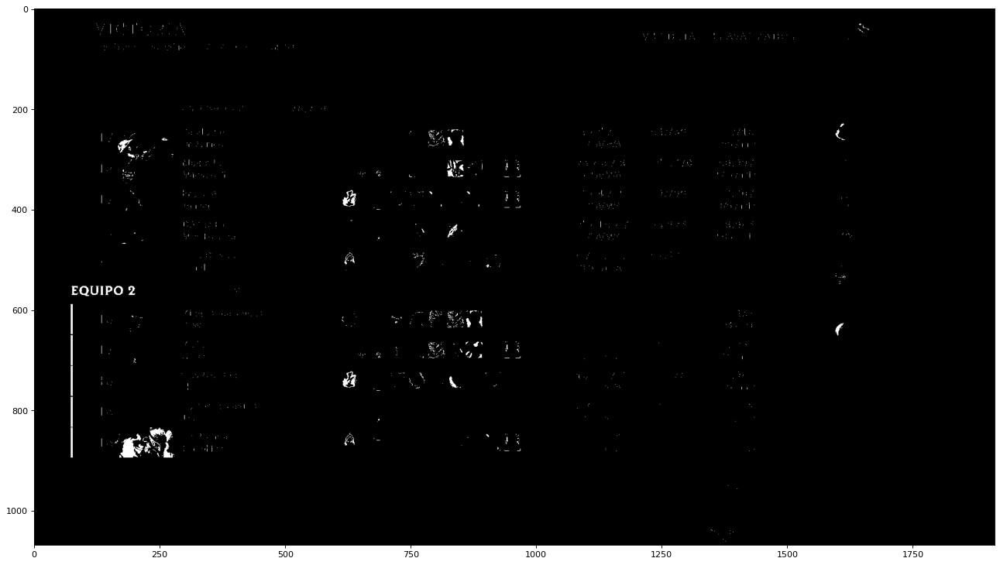

Then, the image is dilated vertically to connect all the red lines of the enemies into a single line. This is done to simplify the process of cropping the player information.


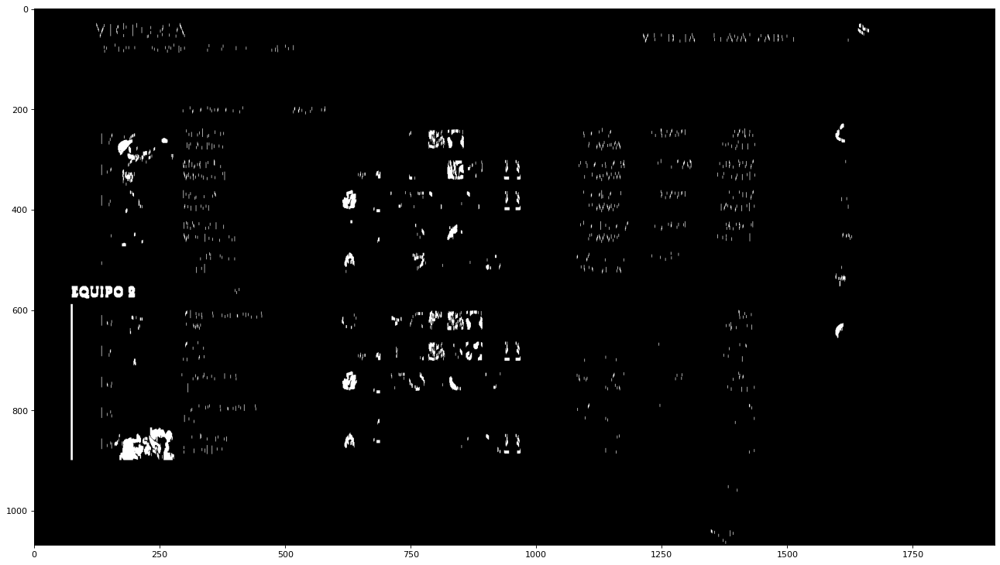

The desired area is not marked in green.


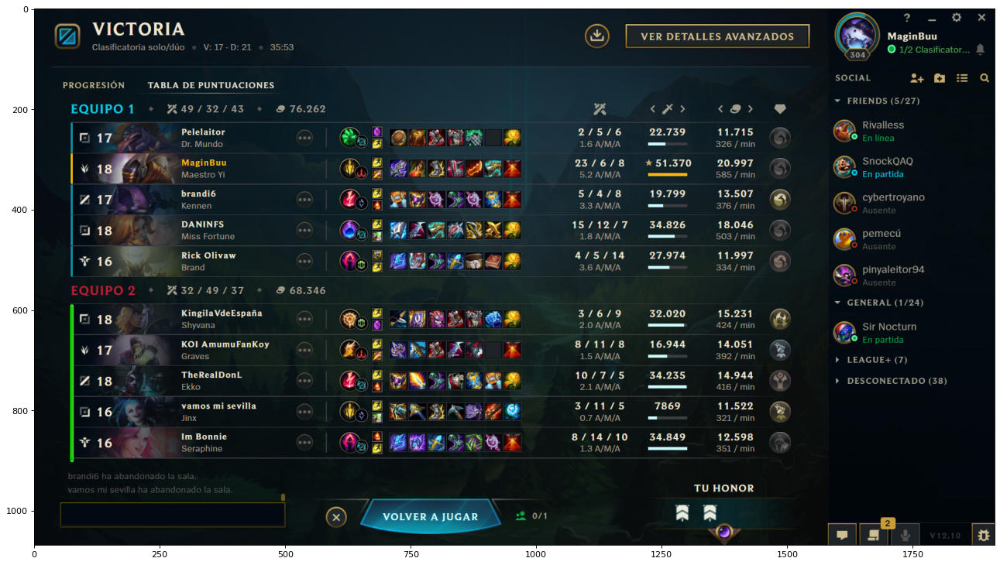

The left part of the image is cropped, resulting in the following image:


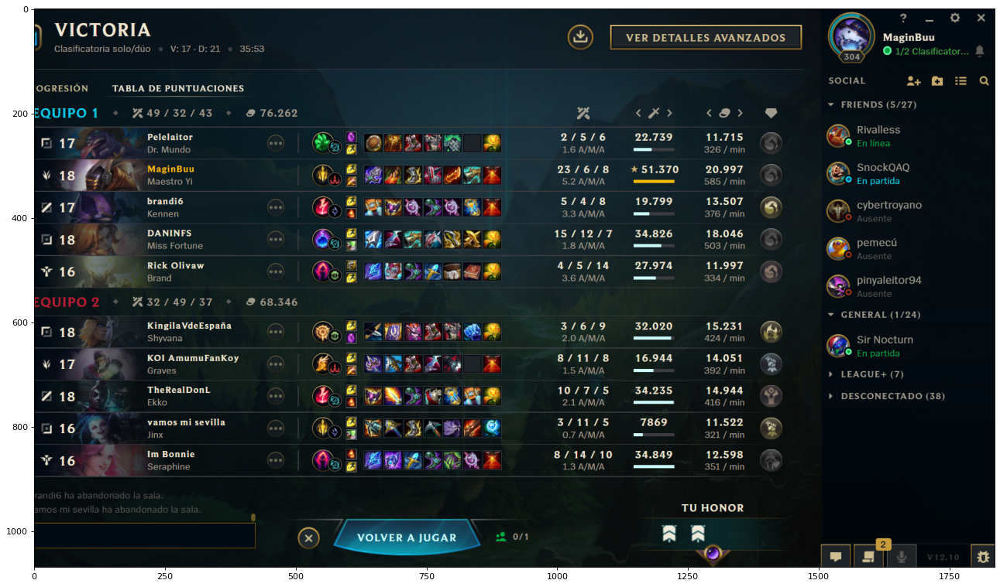

In [6]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

def show_image(image, small=False):
    if small:
        plt.figure(figsize=(5, 5), dpi=80)
    else:
        plt.figure(figsize=(20, 20), dpi=80)
    plt.imshow(image, cmap='gray')
    plt.show()


# Detect the red vertical line (enemy team) and crop the left part of the image
def crop_left_part(image, show_steps = False):
    lower_red = np.array([170, 50, 50])
    upper_red = np.array([360, 250, 250])
    img_hsl = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    mask = cv2.inRange(img_hsl, lower_red, upper_red)

    if(show_steps):
        print("The red color belonging to the enemies in the image is utilized to determine the starting point of the player information.")
        show_image(mask)  

    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1, 2))
    mask = cv2.dilate(mask, kernel, iterations=5)

    if(show_steps):
        print("Then, the image is dilated vertically to connect all the red lines of the enemies into a single line. This is done to simplify the process of cropping the player information.")  
        show_image(mask)  


    # Detect vertical lines
    vertical_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1, 20))
    detect_vertical = cv2.morphologyEx(mask, cv2.MORPH_OPEN, vertical_kernel, iterations=2)
    cnts = cv2.findContours(detect_vertical, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = cnts[0] if len(cnts) == 2 else cnts[1]

    # Filter by length and get the one that is more at the left side of the image
    cnts = filter(lambda item: cv2.contourArea(item) > 100, cnts)
    cnts = sorted(cnts, key=lambda item1: item1[0][0][0])
    x, y, w, h = cv2.boundingRect(cnts[0])

    if(show_steps):
        print("The desired area is not marked in green.")
        image_with_contours = np.copy(image)
        cv2.rectangle(image_with_contours, (x,y), (x+w,y+h), (0,255,0), 2)   
        show_image(image_with_contours)

        print("The left part of the image is cropped, resulting in the following image:")
        show_image(image[:, x + w:])

    # Crop the left part of the image
    return image[:, x + w:], y


print("Input image:")
image = cv2.cvtColor(cv2.imread(f'./ipynb_photos/default.png'), cv2.COLOR_BGR2RGB)
show_image(image)

print("To begin, the image is cropped to remove the left padding:\n\n")
image, team2_y = crop_left_part(image, show_steps = True)



The following step involves the cropping of the friends list on the right side of the image. It should be noted that this step will have no effect if the image has already been cropped.
The image is converted back to binary form


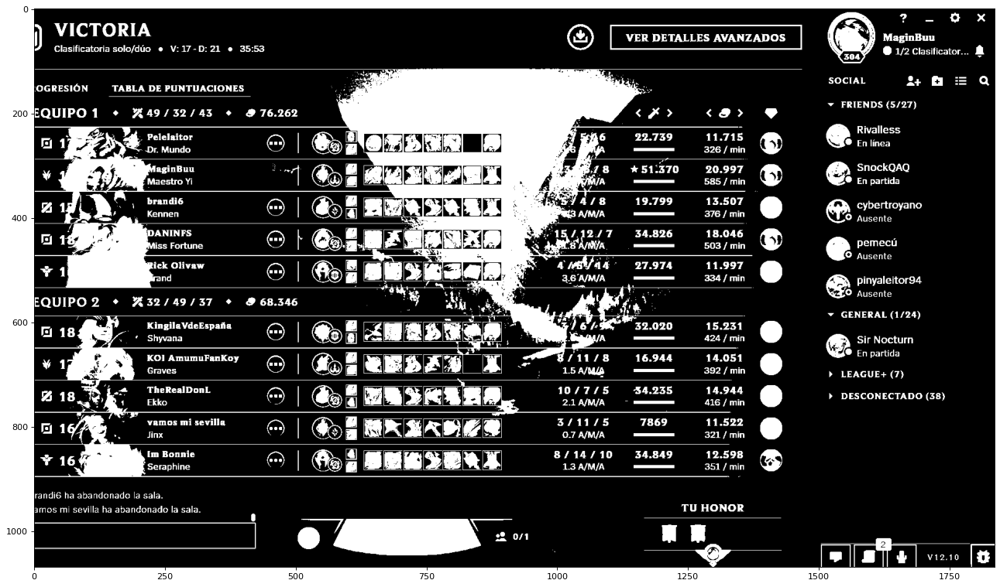

The image is then dilated vertically to connect all the characters in the player information rows. This is done to simplify the task of detecting and cropping the individual rows of player information.


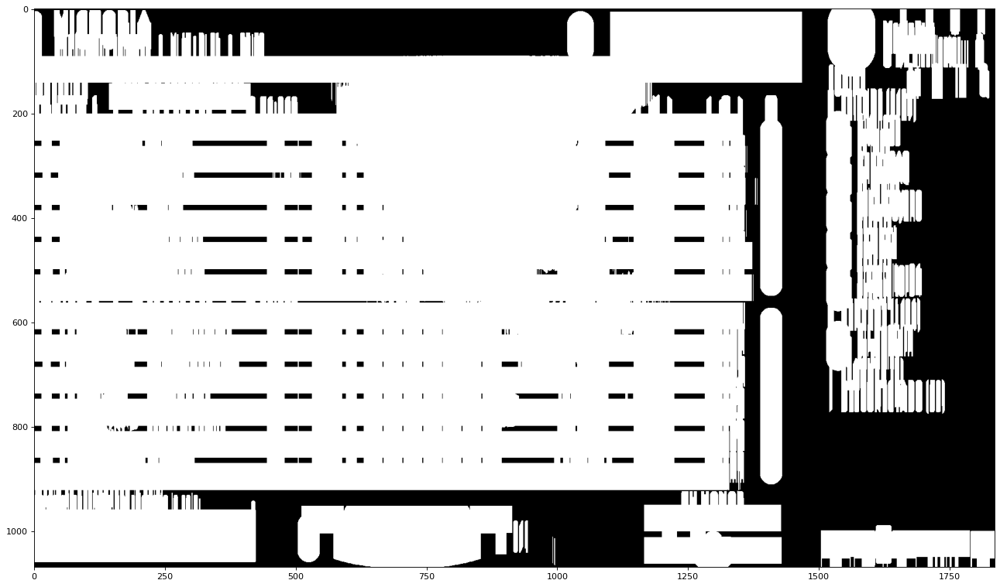

The desired area is not marked in green.


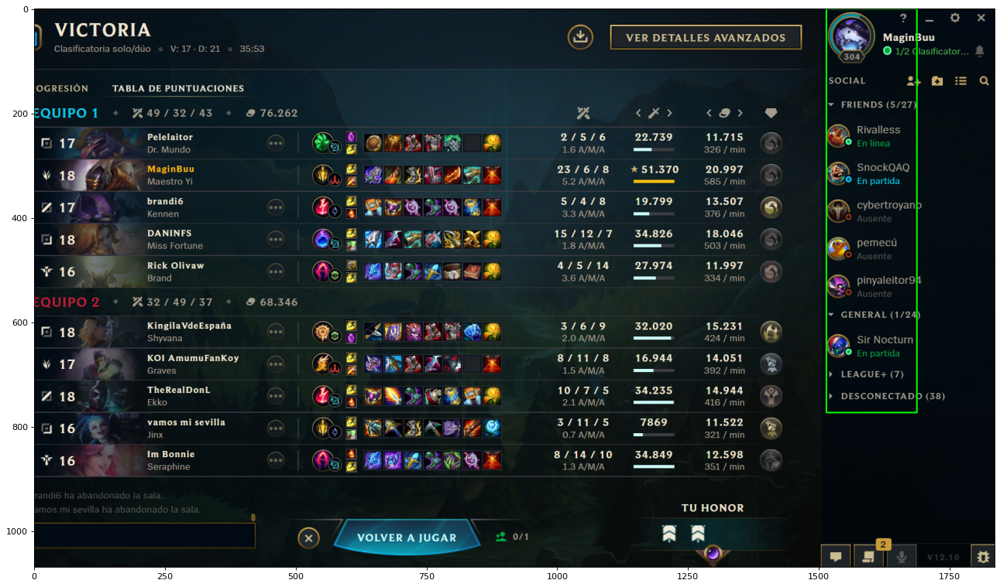

The right part of the image is cropped, resulting in the following image:


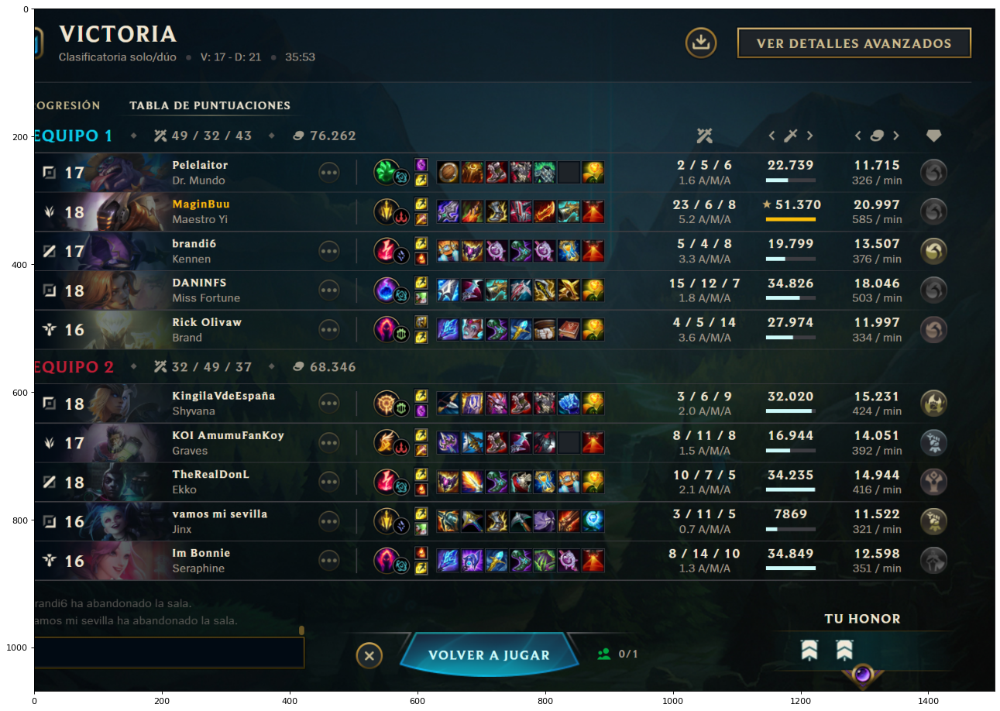

In [7]:
#GET THE CONTORNS THAT HAVE A HEIGHT > IMAGE.HEIGHT / 2, ITS WIDTH > IMAGE.WIDTH / 5 AND ARE IN THE RIGHT PART OF THE IMAGE
def filter_vertical_right_side(cnt, image):
    x, y, w, h = cv2.boundingRect(cnt)
    if h > (image.shape[0] / 2) and w < (image.shape[1] / 5) and x > (image.shape[1] * 0.75):
        return True
    return False

# Detect if there is a friend list (dilating the image vertically and searching for a separated part) and crop it
def crop_friend_list(image, show_steps = False):
    image_enhanced = cv2.equalizeHist(cv2.cvtColor(image, cv2.COLOR_RGB2GRAY))
    thresh = 200
    img_binary = cv2.threshold(image_enhanced, thresh, 255, cv2.THRESH_BINARY)[1]

    if(show_steps):
        print("The image is converted back to binary form")
        show_image(img_binary)

    # Dilate the image vertically to find the different parts of the image
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1, 3))
    image_dilated = cv2.dilate(img_binary, kernel, iterations=25)

    if(show_steps):
        print("The image is then dilated vertically to connect all the characters in the player information rows. This is done to simplify the task of detecting and cropping the individual rows of player information.")
        show_image(image_dilated)

    # Find the contours of the image
    cnts = cv2.findContours(image_dilated, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = cnts[0] if len(cnts) == 2 else cnts[1]

    # Delete contours that are not useful for this function
    cnts = filter(lambda item: filter_vertical_right_side(item, img_binary), cnts)

    # Sort from right to left
    cnts = sorted(cnts, key=lambda item1: item1[0][0][0], reverse=True)

    if(show_steps):
        x, y, w, h = cv2.boundingRect(cnts[0])
        print("The desired area is not marked in green.")
        image_with_contours = np.copy(image)
        cv2.rectangle(image_with_contours, (x,y), (x+w,y+h), (0,255,0), 2)   
        show_image(image_with_contours)

        print("The right part of the image is cropped, resulting in the following image:")
        show_image(image[:, 0:x - 10])


    if len(cnts) > 0:
        x, y, w, h = cv2.boundingRect(cnts[0])
        return image[:, 0:x - 10]  # Image without friend list

    return image


print("The following step involves the cropping of the friends list on the right side of the image. It should be noted that this step will have no effect if the image has already been cropped.")
image = crop_friend_list(image, show_steps = True)

The next step involves the removal of the top (victory part) and bottom (play again part) of the image. 
It is important to mention that this step will only be applied if the image has not yet been cropped.

The image is converted back to binary form


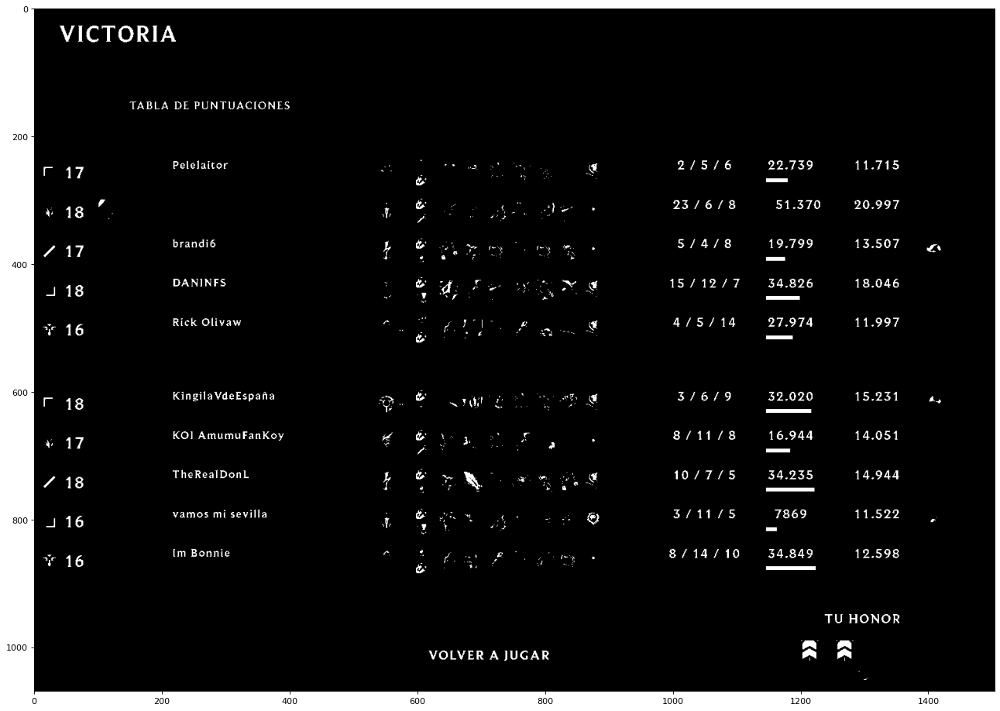

The image is then dilated horizontally in order to get all the rows of player information.


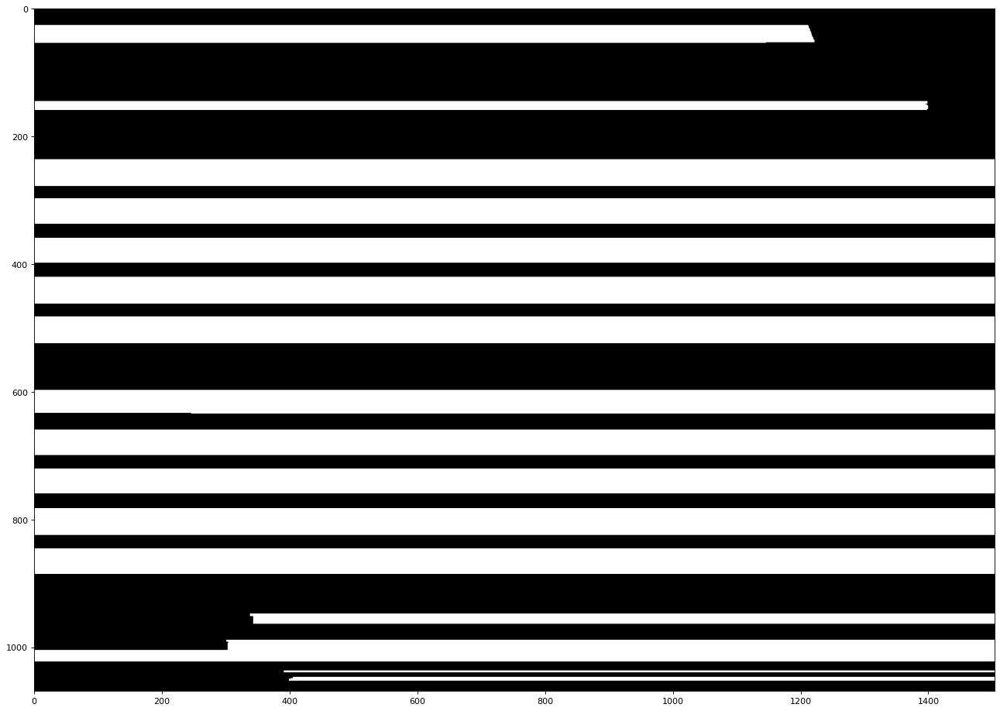

Contours that are in close proximity are used to locate the desired area that needs to be cropped, which is not marked in green.


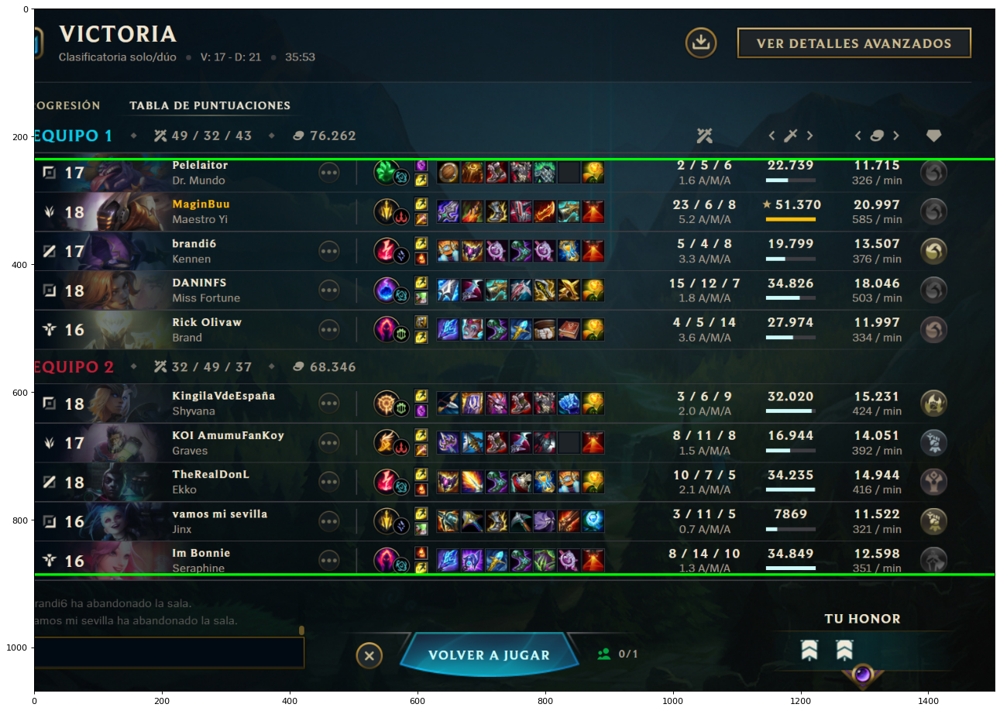

The resulting cropped image is shown below:


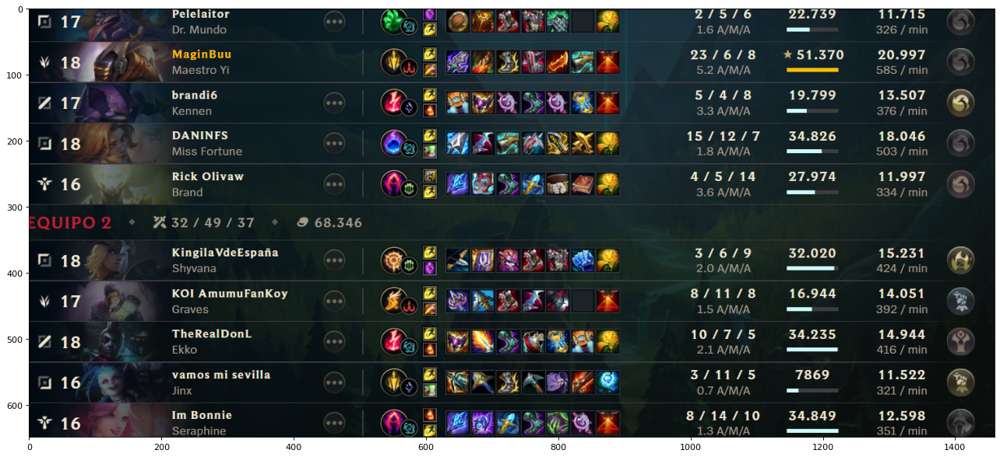

The section containing information about the victory or defeat of the game is also extracted and saved for future use, but is not currently used in this project.


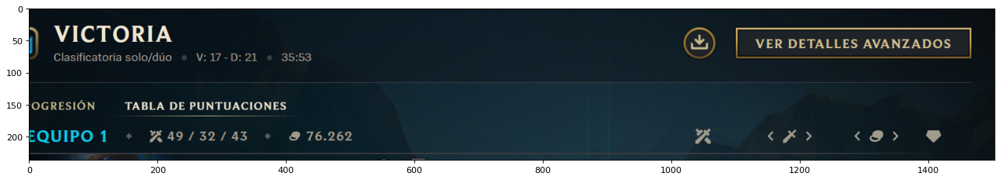

In [8]:
def filter_team1(cnt, team2_y):
    x, y, w, h = cv2.boundingRect(cnt)
    if ((y < team2_y - 20) and ((y + h) < team2_y - 20)):
        return True
    return False

def filter_team2(cnt, team2_y):
    x, y, w, h = cv2.boundingRect(cnt)
    if y > team2_y - 20:
        return True
    return False

def filter_min_vertical(cnt, image):
    x, y, w, h = cv2.boundingRect(cnt)
    if h > (image.shape[0] / 45):
        return True
    return False

def filter_min_horizontal(cnt):
    x, y, w, h = cv2.boundingRect(cnt)
    return x < 10

# Detect if the image has a top (victory - defeat) and bottom (play again) and crop it
def crop_top_bottom(image, team2_y, show_steps = False):
    image_enhanced = cv2.equalizeHist(cv2.cvtColor(image, cv2.COLOR_RGB2GRAY))
    thresh = 250
    im_bw = cv2.threshold(image_enhanced, thresh, 255, cv2.THRESH_BINARY)[1]

    if(show_steps):
        print("The image is converted back to binary form")
        show_image(im_bw)

    # Dilate the image horizontally to find the different rows (usually the top part, players, and bottom part)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (20, 1))
    image_dilated = cv2.dilate(im_bw, kernel, iterations=100)

    # Dilate once vertically to avoid small parts
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1, 3))
    image_dilated = cv2.dilate(image_dilated, kernel, iterations=1)

    if(show_steps):
        print("The image is then dilated horizontally in order to get all the rows of player information.")
        show_image(image_dilated)
        
    # Find the different rows
    cnts = cv2.findContours(image_dilated, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = cnts[0] if len(cnts) == 2 else cnts[1]

    # Filter small rows
    cnts = filter(lambda item: filter_min_vertical(item, im_bw), cnts)
    cnts = filter(lambda item: filter_min_horizontal(item), cnts)

    # Sort from top to bottom
    cnts = sorted(cnts, key=lambda item1: item1[0][0][1])

    top = None
    bottom = None

    if(len(cnts) > 0):
        found_top = False
        found_bottom = False
        cnts2 = cnts[:]
        num_cnts_team1 = len(list(filter(lambda item: filter_team1(item, team2_y), cnts2)))

        victory_image = None

        # Find the top player (if there's a lot of space between the contour and the previous one and it's on the top of the image)
        while not found_top:
            if(num_cnts_team1 > 5):
                cnts2.pop(0)
                num_cnts_team1 -= 1
                continue
            x, y, w, h = cv2.boundingRect(cnts2[0])
            x2, y2, w2, h2 = cv2.boundingRect(cnts2[1])
            x3, y3, w3, h3 = cv2.boundingRect(cnts2[2])
            if(abs((y3 - (y2 + h2)) - (y2 - (y + h))) < image.shape[0] / 40):
                victory_image = image[0:y, :]
                top = y
                found_top = True
            elif((y2 - (y + h) > image.shape[0] / 20) and ((y3 - (y2 + h2)) <= (y2 - (y + h)))):
                victory_image = image[0:y + h, :]
                top = y2
                found_top = True
            elif(y > image.shape[0] / 10): 
                top = y
                found_top = True
            else:
                cnts2.pop(0)
                
            if(len(cnts2) < 2):
                top = 0
                found_top = True

        cnts2 = cnts[:]
        num_cnts_team2 = len(list(filter(lambda item: filter_team2(item, team2_y), cnts2)))


        # Find the bottom player (if there's a lot of space between the contour and the previous one and it's on the bottom of the image)
        while not found_bottom:
            if(num_cnts_team2 > 5):
                num_cnts_team2 -= 1
                cnts2.pop(-1)
                continue

            x, y, w, h = cv2.boundingRect(cnts2[-1])
            x2, y2, w2, h2 = cv2.boundingRect(cnts2[-2])
            x3, y3, w3, h3 = cv2.boundingRect(cnts2[-3])
            if (abs((y - (y2 + h2)) - (y2 - (y3 + h3))) < image.shape[0] / 40):
                bottom = y + h
                found_bottom = True
            elif((y - (y2 + h2) > image.shape[0] / 20) and ((y - (y2 + h2)) >= (y2 - (y3 + h3)))):
                bottom = y2 + h2
                found_bottom = True
            elif(y < image.shape[0] * 0.75):
                bottom = y + h
                found_bottom = True
            else:
                cnts2.pop(-1)
            if(len(cnts2) < 2):
                bottom = image.shape[0]
                found_bottom = True

        if(show_steps):
            print("Contours that are in close proximity are used to locate the desired area that needs to be cropped, which is not marked in green.")
            image_with_contours = np.copy(image)
            cv2.rectangle(image_with_contours, (0,top - 1), (image.shape[1],top), (0,255,0), 2)   
            cv2.rectangle(image_with_contours, (0,bottom), (image.shape[1],bottom + 1), (0,255,0), 2)   
            show_image(image_with_contours)

        image = image[top:bottom, :]

        # If the image is too wide, it can contain the friend list (the previous function may have failed)
        height = image.shape[0]
        width = image.shape[1]
        if(width / height > 2.25):
            image = image[:, 0: int(2.25 * height)]

        return image, victory_image
    else:
        return None, None
    
print("The next step involves the removal of the top (victory part) and bottom (play again part) of the image.",
      "\nIt is important to mention that this step will only be applied if the image has not yet been cropped.\n")
image, victory_image = crop_top_bottom(image, team2_y, show_steps=True)

print("The resulting cropped image is shown below:")
show_image(image)

print("The section containing information about the victory or defeat of the game is also extracted and saved for future use, but is not currently used in this project.")
show_image(victory_image)

The next step is to crop the resulting image into smaller ones, where each image contains the information of a single player row.

The image is converted back to binary form


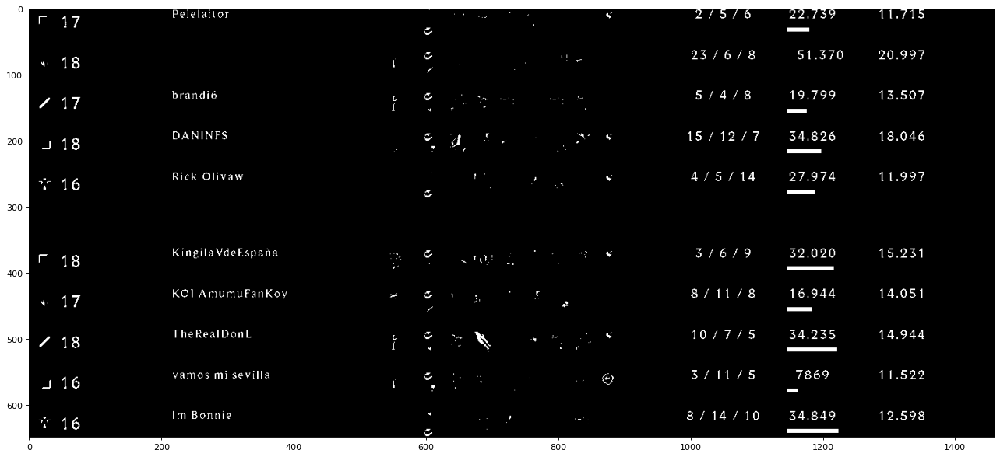

The image is then dilated horizontally again


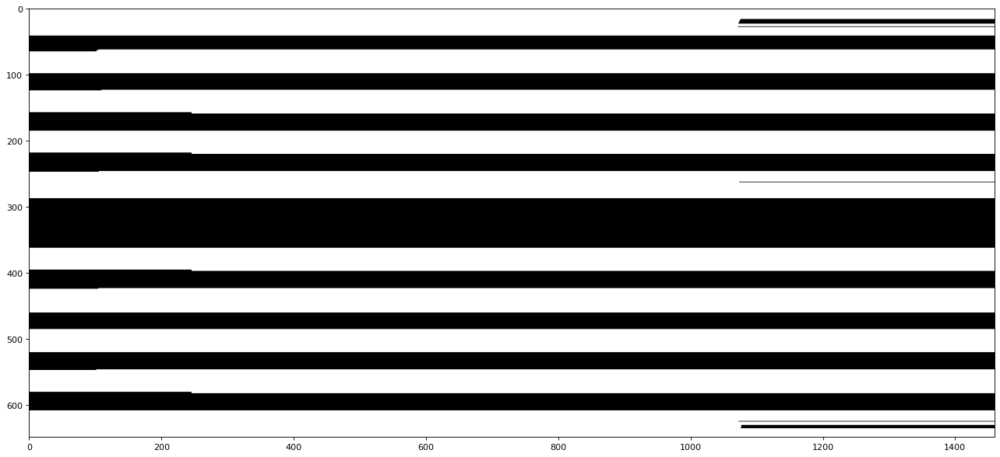

The players can be easily identified


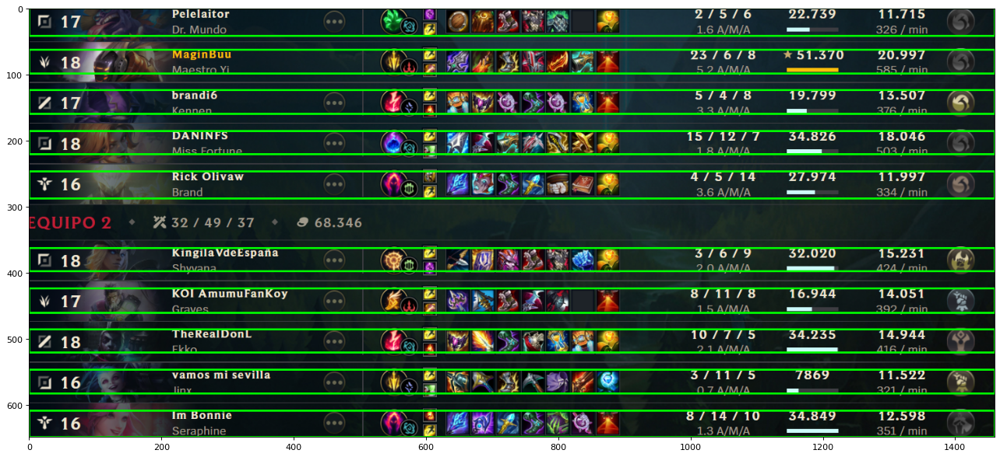

Result:


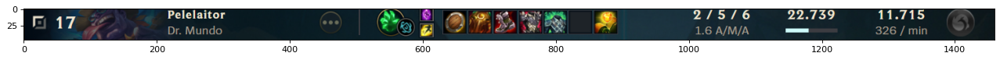

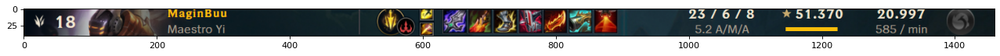

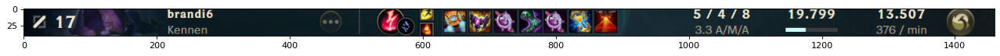

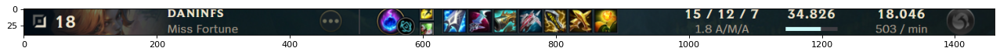

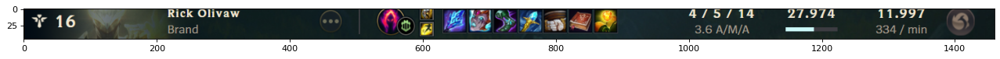

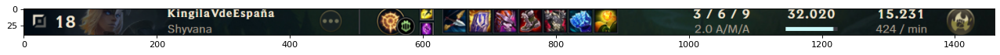

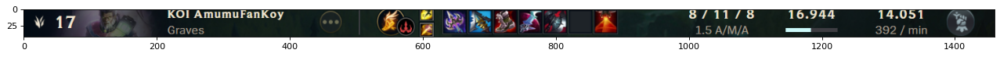

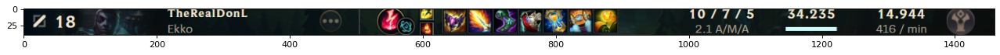

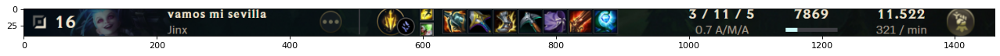

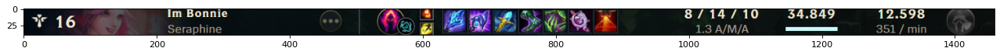

In [9]:
#ALL COUNTORNS HAVE TO BE HIGHER THAN THE IMAGE HEIGHT / 30
def filter_min_vertical(cnt, image):
    x, y, w, h = cv2.boundingRect(cnt)
    if h > (image.shape[0] / 45):
        return True
    return False

#DETECT EACH PLAYER ROW AND CROP IT
def get_player_images(image, show_steps = False):
    image_enhanced = cv2.equalizeHist(cv2.cvtColor(image, cv2.COLOR_RGB2GRAY))
    thresh = 250
    im_bw = cv2.threshold(image_enhanced, thresh, 255, cv2.THRESH_BINARY)[1]

    if(show_steps):
        print("The image is converted back to binary form")
        show_image(im_bw)
    #dilate the image horizontally to find each player row
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (20, 1))
    dilate = cv2.dilate(im_bw, kernel, iterations=100)
    #dilate once vertically to avoid small parts
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1, 3))
    dilate = cv2.dilate(dilate, kernel, iterations=1)

    if(show_steps):
        print("The image is then dilated horizontally again")
        show_image(dilate)

    #find the different rows
    cnts = cv2.findContours(dilate, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = cnts[0] if len(cnts) == 2 else cnts[1]
    #filter small rows
    cnts = filter(lambda item: filter_min_vertical(item, im_bw), cnts)
    #sort from top to bottom
    cnts = sorted(cnts, key=lambda item1: item1[0][0][1])

    imgs = []
    #if has detected the 10 players, crop each player row
    if(len(cnts) == 10):
        if(show_steps):
            print("The players can be easily identified")
            image_with_contours = np.copy(image)
            for cnt in cnts:
                x, y, w, h = cv2.boundingRect(cnt)
                cv2.rectangle(image_with_contours, (x,y), (x+w,y+h), (0,255,0), 2)
            show_image(image_with_contours)   

        for cnt in cnts:
            x, y, w, h = cv2.boundingRect(cnt)
            imgs.append(image[y:y + h + 5, :])
    #else find the mid gap and crop each player individually (knowing that each part has 5 players)
    else:
        x, y, w, h = cv2.boundingRect(cnts[0])
        x2, y2, w2, h2 = cv2.boundingRect(cnts[-1])

        i = 0
        max_separation = 0
        cnt_top = None
        cnt_bottom = None
        #get the contourns with bigger gap between them
        for i in range(0, len(cnts) - 1):
            x3, y3, w3, h3 = cv2.boundingRect(cnts[i])
            x4, y4, w4, h4 = cv2.boundingRect(cnts[i + 1])
            if(y4 - (y3 + h3) > max_separation):
                max_separation = y4 - (y3 + h3)
                cnt_top = cnts[i]
                cnt_bottom = cnts[i + 1]
            
        #crop each player row
        if(cnt_top is not None and cnt_bottom is not None):
            x4, y4, w4, h4 = cv2.boundingRect(cnt_bottom)
            height = (y2 + h2 - y4) / 5 + 3
            for i in range(0, 10):
                y5 = y2 - height * i
                if(i > 4):
                    y5 -= max_separation / 2
                imgs.append(image[int(y5):int(y5 + height), :])
                imgs.reverse()
    return imgs

print("The next step is to crop the resulting image into smaller ones, where each image contains the information of a single player row.\n")
player_images = get_player_images(image, show_steps=True)
print("Result:")
for img in player_images:
    show_image(img)

In the next step of the process, we are separating each text element that we want to extract from the player row image. 
These elements include the player's level, username, gold, damage dealt, and KDA ratio.

This function works similar than the previous one, we convert the image to binary and then we get the information by filtering the contours 
After obtaining the required element, the image is cropped to reduce the number of elements for analysis in the next steps.


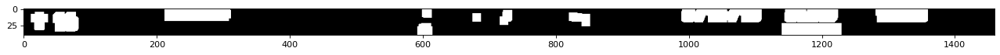

lvl:


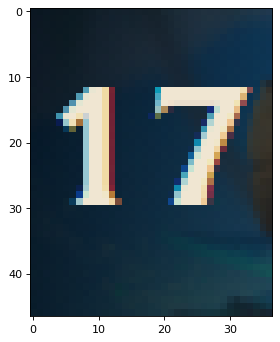

username:


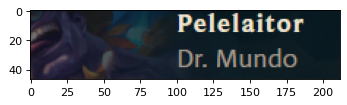

gold:


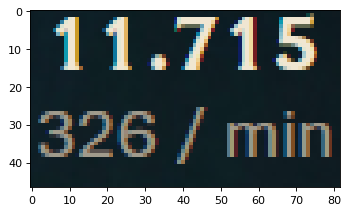

dmg:


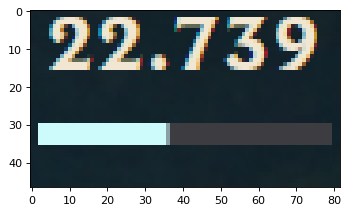

kda:


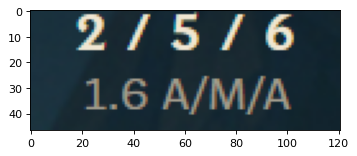

In [10]:
#GET THE ELEMENTS COORDS (LVL, USERNAME, KDA, DMG, GOLD) TO DO THIS WE TRY TO FIND THE ELEMENT IN EACH IMAGE AND THEN ONLY GET THE COORDS THAT HAVE A RELATION BETWEEN (TO AVOID ERRORS)
def get_coords(images, element, x_crop = None, show_steps = False):
    images_cropped = []
    #if we want to get the username we have to crop the left part of the image (the lvl part)
    if element == "username":
        if(x_crop == None):
            raise ValueError('Something went wrong')
        for image in images:
            image = images_cropped.append(image[:, x_crop:])
    #if we want to get the dmg or kda we have to crop the right part of the image (gold + dmg(only getting kda))
    elif element == 'dmg' or element == 'kda':
        if(x_crop == None):
            raise ValueError('Something went wrong')
        for image in images:
            images_cropped.append(image[:, :x_crop])
    else:
        images_cropped = images[:]
    
    
    coords = [] #coords of the element that we want to get
    x, y, w, h = 0, 0, 0, 0

    thresh = 225 if (element == 'lvl' or element == 'username') else 175
    iterations = 3 if element != 'username' else 10
    for image in images_cropped:
        #preprocess the image and dilate to get the text in one element when getting the contours
        image_gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        im_bw = cv2.threshold(image_gray, thresh, 255, cv2.THRESH_BINARY)[1]
        kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 5))
        dilate = cv2.dilate(im_bw, kernel, iterations=iterations)

        cnts = cv2.findContours(dilate, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        cnts = cnts[0] if len(cnts) == 2 else cnts[1]
        #filter small contours
        cnts = filter(lambda item: cv2.contourArea(item) > 300, cnts)
        #lvl and username are at the left part of the image
        if(element == 'lvl' or element == "username"):
            cnts = sorted(cnts, key=lambda item1: item1[0][0][0])
        #gold, dmg and kda are at the right part of the image
        elif(element == 'gold' or element == 'dmg' or element == 'kda'):
            cnts = sorted(cnts, key=lambda item1: item1[0][0][0], reverse=True)

        if(element == 'lvl' or element == 'username'):
            
            # figure(figsize=(100, 100), dpi=80)
            # imgplot = plt.imshow(image, cmap='gray')
            # plt.show()
            if(len(cnts) > 2):
                for i in range(0, 2):
                    x, y, w, h = cv2.boundingRect(cnts[i])
                    x2, y2, w2, h2 = cv2.boundingRect(cnts[i + 1])

                    if(element == 'username'):
                        if(h2 > image.shape[0] * 0.75):
                            if(x2 - (x + w) < 10):
                                w += x2 - (x + w) + w2 
                            break 
                        elif(x + w > image.shape[1] * 0.4):
                            if(x2 - (x + w) < 10):
                                w += x2 - (x + w) + w2 
                            break
                        elif(w2 > w and x2 + w2 < image.shape[1] * 0.4):
                            if(x2 - (x + w) < 10):
                                w += x2 - (x + w) + w2 
                            break

                    if(x2 - (x + w) > 40):
                        break
                    else:
                        w += x2 - (x + w) + w2
                        
            elif(len(cnts) == 1):
                x, y, w, h = cv2.boundingRect(cnts[0])
            else:
                continue

            if(element == 'lvl'):
                if(x > image.shape[1] / 7):
                    continue
                
                if((w / h) > 1.25):
                    x = int((x + w) - h * 1.25)
                    w = int(h * 1.25)
        else:
            if(len(cnts) > 1):
                x, y, w, h = cv2.boundingRect(cnts[0])
                if(element == 'gold' and (w - h < 10 or w / h < 1.5 or h > image.shape[0] * 0.85)):
                    x, y, w, h = cv2.boundingRect(cnts[1])
            else:
                continue
            
        coords.append([x, w])

    if show_steps and element == 'lvl':
        print("\nThis function works similar than the previous one, we convert the image to binary and then we get the information by filtering the contours",
        "\nAfter obtaining the required element, the image is cropped to reduce the number of elements for analysis in the next steps.")
        show_image(dilate)

    #get the coords that have at least one coord close (looking x)
    i = 0
    num_images = 0
    final_coords = []
    for x, w in coords:
        num_images = 0
        for y in range(0, len(coords)):
            if(y != i):
                x2, w2 = coords[y]
                if(abs(x - x2) < 20):
                    num_images += 1
                if(num_images == 5):
                    final_coords.append([x, w])
                    break
        i += 1

    x, y, w, h = 0, 0, 0, 0
    if(element == 'lvl'):
        x, y, w, h = 0, 0, 0, 0
        for x2, w2 in final_coords:
            x += x2
            w += w2
                                        
        if(len(final_coords) != 0):
            x /= len(final_coords)
            w /= len(final_coords)
    else:
        for x2, w2 in final_coords:
            x = x2 if x2 < x or x == 0 else x
            w = w2 if w2 > w else w
        
    if show_steps:
        print(f'{element}:')
        show_image(images[0][:, int(x):int(x+w)], small=True)
    
    return int(x), 0, int(w), 0

print("In the next step of the process, we are separating each text element that we want to extract from the player row image. \nThese elements include the player's level, username, gold, damage dealt, and KDA ratio.")

x_lvl, y_lvl, w_lvl, h_lvl = get_coords(player_images, 'lvl', show_steps = True)
x_username, y_username, w_username, h_username = get_coords(player_images, 'username', x_lvl + w_lvl, show_steps = True)
x_username += (x_lvl + w_lvl)
x_gold, y_gold, w_gold, h_gold = get_coords(player_images, 'gold', None, show_steps = True)
x_dmg, y_dmg, w_dmg, h_dmg = get_coords(player_images, 'dmg', x_gold - 5, show_steps = True)
x_kda, y_kda, w_kda, h_kda = get_coords(player_images, 'kda', x_dmg - 5, show_steps = True)


### Digit Model Reader 

A convolutional neural network has been developed for the purpose of recognizing numbers and the forward slash symbol ('/') in the images. The dataset used to train the neural network was obtained from the <em>'/input_digits'</em> folder, which was previously extracted from our image dataset.

Found 5801 files belonging to 11 classes.
Using 4641 files for training.
Found 5801 files belonging to 11 classes.
Using 1160 files for validation.
Epoch 1/5
146/146 [==============================] - 11s 62ms/step - loss: 0.5686 - accuracy: 0.8345 - val_loss: 0.0902 - val_accuracy: 0.9724 - lr: 0.0010
Epoch 2/5
146/146 [==============================] - 9s 60ms/step - loss: 0.1157 - accuracy: 0.9716 - val_loss: 0.0546 - val_accuracy: 0.9845 - lr: 9.5000e-04
Epoch 3/5
146/146 [==============================] - 9s 60ms/step - loss: 0.0714 - accuracy: 0.9825 - val_loss: 0.0510 - val_accuracy: 0.9897 - lr: 9.0250e-04
Epoch 4/5
146/146 [==============================] - 9s 60ms/step - loss: 0.0397 - accuracy: 0.9892 - val_loss: 0.0433 - val_accuracy: 0.9914 - lr: 8.5737e-04
Epoch 5/5
146/146 [==============================] - 9s 59ms/step - loss: 0.0373 - accuracy: 0.9920 - val_loss: 0.0455 - val_accuracy: 0.9914 - lr: 8.1451e-04


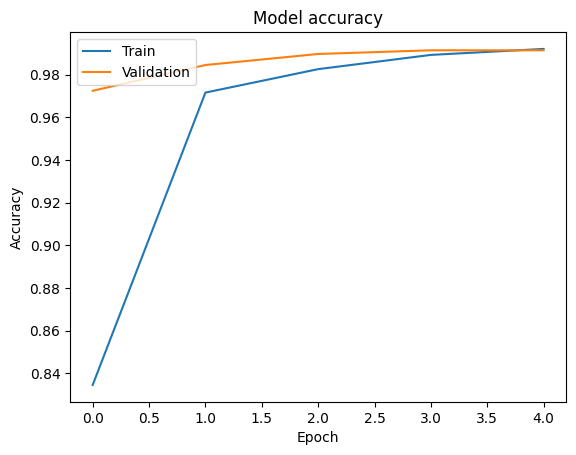

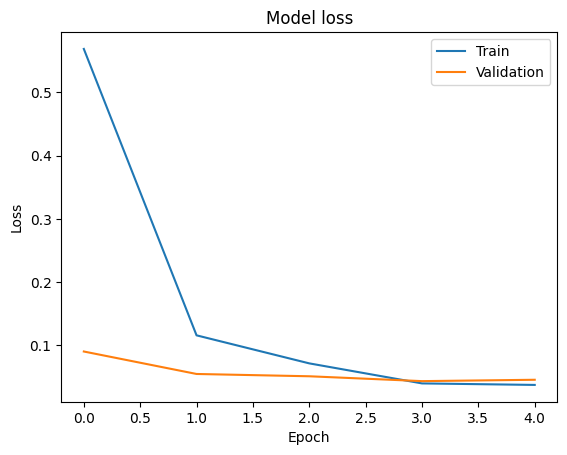

In [11]:
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv2D, BatchNormalization, Normalization, RandomRotation, RandomZoom
from tensorflow.keras.utils import image_dataset_from_directory, img_to_array
from tensorflow.keras.callbacks import LearningRateScheduler
from os.path import exists
from tensorflow import expand_dims

class Digit_Model_Reader:
    def __init__(self, model_path='./models/read_digit_model.h5', epochs=5, dataset_path='./digit_dataset'):
        # Initialize class variables
        self.model_path = model_path if (model_path is not None and model_path != '') else './models/read_digit_model.h5'
        self.dataset_path = dataset_path

        # Load or create, train, and save model
        if exists(self.model_path):
            self.load_model()
        else:
            self.epochs = epochs
            self.create_model()
            self.train_model()
            self.save_model()

    def create_model(self):
        # Create a convolutional neural network model
        model = Sequential()

        # Add layers to the model
        model.add(Conv2D(32, kernel_size=3, activation='relu', input_shape=(28, 28, 1)))
        model.add(BatchNormalization())
        model.add(Conv2D(32, kernel_size=3, activation='relu'))
        model.add(BatchNormalization())
        model.add(Conv2D(32, kernel_size=5, strides=2, padding='same', activation='relu'))
        model.add(BatchNormalization())
        model.add(Dropout(0.4))

        model.add(Conv2D(64, kernel_size=3, activation='relu'))
        model.add(BatchNormalization())
        model.add(Conv2D(64, kernel_size=3, activation='relu'))
        model.add(BatchNormalization())
        model.add(Conv2D(64, kernel_size=5, strides=2, padding='same', activation='relu'))
        model.add(BatchNormalization())
        model.add(Dropout(0.4))

        model.add(Conv2D(128, kernel_size=4, activation='relu'))
        model.add(BatchNormalization())
        model.add(Flatten())
        model.add(Dropout(0.4))
        model.add(Dense(11, activation='softmax'))

        # Compile the model with Adam optimizer and cross-entropy loss
        model.compile(optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"])

        self.model = model

    def train_model(self):
        # Load training and validation datasets
        train_ds = image_dataset_from_directory(
                                                self.dataset_path,
                                                labels='inferred',
                                                color_mode='grayscale',
                                                validation_split=0.2,
                                                subset="training",
                                                label_mode="categorical",
                                                seed=42,
                                                image_size=(28, 28),
                                                batch_size=32)

        val_ds = image_dataset_from_directory(
                                            self.dataset_path,
                                            labels='inferred',
                                            color_mode='grayscale',
                                            validation_split=0.2,
                                            subset="validation",
                                            label_mode="categorical",
                                            seed=42,
                                            image_size=(28, 28),
                                            batch_size=32)

        # Data augmentation
        data_augmentation = Sequential([
            Normalization(),
            RandomRotation(0.1),
            RandomZoom (0.1)
        ])

        train_ds = train_ds.map(
                lambda x, y: (data_augmentation(x, training=True), y))

        val_ds = val_ds.map(
                lambda x, y: (data_augmentation(x, training=True), y))

        # Learning rate scheduler
        annealer = LearningRateScheduler(lambda x: 1e-3 * 0.95 ** x)

        # Train the model
        history = self.model.fit(train_ds, epochs=self.epochs, validation_data=val_ds, callbacks=[annealer])

        # Call the function to plot the metrics
        self.plot_metrics(history)

    def save_model(self):
        # Save the trained model to a file
        self.model.save(self.model_path)

    def load_model(self):
        # Load the model from a file
        self.model = load_model(self.model_path)

    def read(self, img):
        # Convert input image to an array
        img_array = img_to_array(img)
        img_array = expand_dims(img_array, 0)  # Create batch axis

        # Make a prediction using the model
        digit = int(np.argmax(self.model.predict(img_array, verbose=0), axis=-1))

        # Map the output to the corresponding digit or symbol, 2 is '/' because it loades the value 10 (which is /) before than 2 
        if digit == 2:
            digit = "/"
        elif digit > 2:
            digit -= 1

        return digit

    def plot_metrics(self, history):
        # Plot training & validation accuracy values
        plt.figure()
        plt.plot(history.history['accuracy'])
        plt.plot(history.history['val_accuracy'])
        plt.title('Model accuracy')
        plt.ylabel('Accuracy')
        plt.xlabel('Epoch')
        plt.legend(['Train', 'Validation'], loc='upper left')
        plt.show()

        # Plot training & validation loss values
        plt.figure()
        plt.plot(history.history['loss'])
        plt.plot(history.history['val_loss'])
        plt.title('Model loss')
        plt.ylabel('Loss')
        plt.xlabel('Epoch')
        plt.legend(['Train', 'Validation'], loc='upper right')
        plt.show()
    
digit_model = Digit_Model_Reader()



In [11]:
#JUST FOR NOT DELETING THE OUTPUT OF THE TOP ONE

from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv2D, BatchNormalization, Normalization, RandomRotation, RandomZoom
from tensorflow.keras.utils import image_dataset_from_directory, img_to_array
from tensorflow.keras.callbacks import LearningRateScheduler
from os.path import exists
from tensorflow import expand_dims

class Digit_Model_Reader:
    def __init__(self, model_path='./models/read_digit_model.h5', epochs=5, dataset_path='./digit_dataset'):
        # Initialize class variables
        self.model_path = model_path if (model_path is not None and model_path != '') else './models/read_digit_model.h5'
        self.dataset_path = dataset_path

        # Load or create, train, and save model
        if exists(self.model_path):
            self.load_model()
        else:
            self.epochs = epochs
            self.create_model()
            self.train_model()
            self.save_model()

    def create_model(self):
        # Create a convolutional neural network model
        model = Sequential()

        # Add layers to the model
        model.add(Conv2D(32, kernel_size=3, activation='relu', input_shape=(28, 28, 1)))
        model.add(BatchNormalization())
        model.add(Conv2D(32, kernel_size=3, activation='relu'))
        model.add(BatchNormalization())
        model.add(Conv2D(32, kernel_size=5, strides=2, padding='same', activation='relu'))
        model.add(BatchNormalization())
        model.add(Dropout(0.4))

        model.add(Conv2D(64, kernel_size=3, activation='relu'))
        model.add(BatchNormalization())
        model.add(Conv2D(64, kernel_size=3, activation='relu'))
        model.add(BatchNormalization())
        model.add(Conv2D(64, kernel_size=5, strides=2, padding='same', activation='relu'))
        model.add(BatchNormalization())
        model.add(Dropout(0.4))

        model.add(Conv2D(128, kernel_size=4, activation='relu'))
        model.add(BatchNormalization())
        model.add(Flatten())
        model.add(Dropout(0.4))
        model.add(Dense(11, activation='softmax'))

        # Compile the model with Adam optimizer and cross-entropy loss
        model.compile(optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"])

        self.model = model

    def train_model(self):
        # Load training and validation datasets
        train_ds = image_dataset_from_directory(
                                                self.dataset_path,
                                                labels='inferred',
                                                color_mode='grayscale',
                                                validation_split=0.2,
                                                subset="training",
                                                label_mode="categorical",
                                                seed=42,
                                                image_size=(28, 28),
                                                batch_size=32)

        val_ds = image_dataset_from_directory(
                                            self.dataset_path,
                                            labels='inferred',
                                            color_mode='grayscale',
                                            validation_split=0.2,
                                            subset="validation",
                                            label_mode="categorical",
                                            seed=42,
                                            image_size=(28, 28),
                                            batch_size=32)

        # Data augmentation
        data_augmentation = Sequential([
            Normalization(),
            RandomRotation(0.1),
            RandomZoom (0.1)
        ])

        train_ds = train_ds.map(
                lambda x, y: (data_augmentation(x, training=True), y))

        val_ds = val_ds.map(
                lambda x, y: (data_augmentation(x, training=True), y))

        # Learning rate scheduler
        annealer = LearningRateScheduler(lambda x: 1e-3 * 0.95 ** x)

        # Train the model
        history = self.model.fit(train_ds, epochs=self.epochs, validation_data=val_ds, callbacks=[annealer])

        # Call the function to plot the metrics
        self.plot_metrics(history)

    def save_model(self):
        # Save the trained model to a file
        self.model.save(self.model_path)

    def load_model(self):
        # Load the model from a file
        self.model = load_model(self.model_path)

    def read(self, img):
        # Convert input image to an array
        img_array = img_to_array(img)
        img_array = expand_dims(img_array, 0)  # Create batch axis

        # Make a prediction using the model
        digit = int(np.argmax(self.model.predict(img_array, verbose=0), axis=-1))

        # Map the output to the corresponding digit or symbol, 2 is '/' because it loades the value 10 (which is /) before than 2 
        if digit == 2:
            digit = "/"
        elif digit > 2:
            digit -= 1

        return digit

    def plot_metrics(self, history):
        # Plot training & validation accuracy values
        plt.figure()
        plt.plot(history.history['accuracy'])
        plt.plot(history.history['val_accuracy'])
        plt.title('Model accuracy')
        plt.ylabel('Accuracy')
        plt.xlabel('Epoch')
        plt.legend(['Train', 'Validation'], loc='upper left')
        plt.show()

        # Plot training & validation loss values
        plt.figure()
        plt.plot(history.history['loss'])
        plt.plot(history.history['val_loss'])
        plt.title('Model loss')
        plt.ylabel('Loss')
        plt.xlabel('Epoch')
        plt.legend(['Train', 'Validation'], loc='upper right')
        plt.show()

digit_model = Digit_Model_Reader()


First, the full image is preprocessed in order to read the digits.


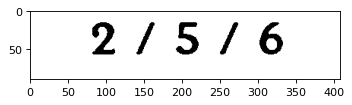

The next step involves using OpenCV to locate the digits within the preprocessed image.


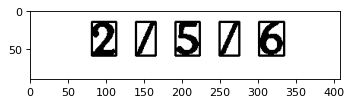

Then each digit is read using the digit model reader that was implemented earlier. For this example, the resulting values are: 2/5/6


The remaining digit functions (dmg, gold, and lvl) work in a similar manner to the aforementioned KDA digit function. 
The images are preprocessed and cropped to isolate the desired digits, which are then fed into the digit model reader for classification.


level: 17


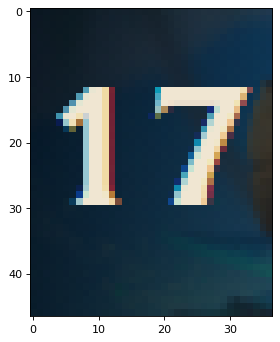

Gold: 11715


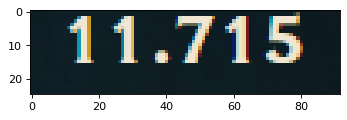

Dmg: 22739


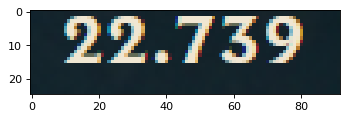

In [12]:
#ALL COUNTORNS HAVE TO BE HIGHER THAN THE IMAGE HEIGHT / 30
def filter_non_digits(cnt, cnts):
    avg_h = sum(list(map(lambda temp_cnt: cv2.boundingRect(temp_cnt)[3], cnts))) / len(cnts)
    avg_h *= 0.9

    x, y, w, h = cv2.boundingRect(cnt)
    if h > avg_h:
        return True
    return False

#GET THE IMAGE IN A SHAPE OF 28x28 (ONLY WORKS WITH SINGLE DIGITS)
def preprocess_digit(img):
    padding_height_bot = 0 if img.shape[0] >= img.shape[1] else int((img.shape[1] - img.shape[0]) / 2)
    padding_height_top = 0 if img.shape[0] >= img.shape[1] else int((img.shape[1] - img.shape[0]) / 2) + ((img.shape[1] - img.shape[0]) % 2)
    padding_width_left = 0 if img.shape[1] >= img.shape[0] else int((img.shape[0] - img.shape[1]) / 2)
    padding_width_right = 0 if img.shape[1] >= img.shape[0] else int((img.shape[0] - img.shape[1]) / 2) + ((img.shape[0] - img.shape[1]) % 2)

    img2 = cv2.copyMakeBorder(img, padding_height_top, padding_height_bot, padding_width_right, padding_width_left, borderType=cv2.BORDER_CONSTANT, value=255)
    img2 = cv2.resize(img2, (26, 26))

    img2 = cv2.copyMakeBorder(img2, 1, 1, 1, 1, borderType=cv2.BORDER_CONSTANT, value=255)


    return img2

#GET THE IMAGE IN BINARY READY TO ANALYZE
def preprocess_img(img, threshold = 150):
    img = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    img2 = cv2.resize(img, None, fx=3, fy=3, interpolation=cv2.INTER_CUBIC)
    mask = img2 < threshold
    img2[mask] = 0
    img2 = cv2.copyMakeBorder(img2, 10,5,10,5, borderType=cv2.BORDER_CONSTANT, value=0)
    img2 = cv2.equalizeHist(img2)
    img2 = cv2.bilateralFilter(img2,4,25, 25)
    img2 = cv2.GaussianBlur(img2, (3, 3), 0)
    img2 = cv2.equalizeHist(img2)
    img2 = 255 - img2
    _,img2 = cv2.threshold(img2,150,255,cv2.THRESH_BINARY)

    return img2

#GET DMG/GOLD STRING FROM UNPROCESED IMG
def get_dmg_gold_lvl_from_image(img, digit_model):
    img = preprocess_img(img)

    #find each digit
    contours, hierarchy = cv2.findContours(img, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    cnts = []
    #check that is not a contour inside a digit
    for y in range(len(contours)):
        if hierarchy[0,y,3] == 0:
            cnts.append(contours[y])
    cnts2 = list(cnts)

    #kda and gold sometimes have non digits characters, delete them by filtering only the big cnts
    cnts = filter(lambda item: filter_non_digits(item, cnts2), cnts)

    #sort from left to right
    cnts = sorted(cnts, key=lambda item1: item1[0][0][0])

    return_string = ''
    for cnt in cnts:
        x_digit, y_digit, w_digit, h_digit = cv2.boundingRect(cnt)
        img_digit = img[y_digit:y_digit+h_digit, x_digit:x_digit+w_digit]
        #add border to the digit to make it easier to read
        img_digit = preprocess_digit(img_digit)

        digit = str(digit_model.read(img_digit))
        return_string += digit

    return return_string


#GET KDA STRING FROM UNPROCESED IMG
def get_kda_from_image(kda_image, digit_model, show_steps = False):
    #kda was not reading as good as the other ones, in this case we have divided into digits and read individually and if
    #it fails, we read the whole text
    kda_image = preprocess_img(kda_image)

    if show_steps:
        print("First, the full image is preprocessed in order to read the digits.")
        show_image(kda_image, small=True)

    #find each digit
    contours, hierarchy = cv2.findContours(kda_image, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    cnts = []
    #check that is not a contour inside a digit
    for y in range(len(contours)):
        if hierarchy[0,y,3] == 0:
            cnts.append(contours[y])
    #sort from left to right
    cnts = sorted(cnts, key=lambda item1: item1[0][0][0])

    if show_steps:
        print("The next step involves using OpenCV to locate the digits within the preprocessed image.")
        image_with_contours = np.copy(kda_image)
        for cnt in cnts:
            x_digit, y_digit, w_digit, h_digit = cv2.boundingRect(cnt)
            cv2.rectangle(image_with_contours, (x_digit,y_digit), (x_digit+w_digit,y_digit+h_digit), (0,255,0), 2)  
        show_image(image_with_contours, small=True)


    kda_string = ''
    for cnt in cnts:
        x_digit, y_digit, w_digit, h_digit = cv2.boundingRect(cnt)
        img_digit = kda_image[y_digit:y_digit+h_digit, x_digit:x_digit+w_digit]
        #add border to the digit to make it easier to read
        img_digit = preprocess_digit(img_digit)

        digit = str(digit_model.read(img_digit))
        kda_string += digit
    
    if show_steps:
        print(f'Then each digit is read using the digit model reader that was implemented earlier. For this example, the resulting values are: {kda_string}')
    
    return kda_string

player = Player()


roles = ['top', 'jungle', 'mid', 'adc', 'support']

# The role of the player being analyzed is determined according to the order of the player information in the image. In this case, as the player being analyzed is the first one, they will be playing as the top role.
player.role = roles[0]

player_image = player_images[0]

player.kda = get_kda_from_image(player_image[0:int(player_image.shape[0] * 0.55), (x_kda - 5):(x_kda + w_kda + 5)], digit_model, show_steps=True)  

print("\n\nThe remaining digit functions (dmg, gold, and lvl) work in a similar manner to the aforementioned KDA digit function. \nThe images are preprocessed and cropped to isolate the desired digits, which are then fed into the digit model reader for classification.")

player.lvl = get_dmg_gold_lvl_from_image(player_image[:, x_lvl:x_lvl+w_lvl], digit_model)

print(f'\n\nlevel: {player.lvl}')
show_image(player_image[:, x_lvl:x_lvl+w_lvl], small=True)

player.gold = get_dmg_gold_lvl_from_image(player_image[0:int(player_image.shape[0] * 0.55), (x_gold - 5):(x_gold + w_gold + 5)], digit_model)

print(f'Gold: {player.gold}')
show_image(player_image[0:int(player_image.shape[0] * 0.55), (x_gold - 5):(x_gold + w_gold + 5)], small=True)

player.dmg = get_dmg_gold_lvl_from_image(player_image[0:int(player_image.shape[0] * 0.55), (x_dmg - 5):(x_dmg + w_dmg + 5)], digit_model)

print(f'Dmg: {player.dmg}')
show_image(player_image[0:int(player_image.shape[0] * 0.55), (x_dmg - 5):(x_dmg + w_dmg + 5)], small=True)



se han congelado 16 capas
Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 1, 1, 512)         14714688  
                                                                 
 flatten_2 (Flatten)         (None, 512)               0         
                                                                 
 dense_6 (Dense)             (None, 2048)              1050624   
                                                                 
 dropout_4 (Dropout)         (None, 2048)              0         
                                                                 
 dense_7 (Dense)             (None, 512)               1049088   
                                                                 
 dropout_5 (Dropout)         (None, 512)               0         
                                                                 
 dense_8 (Dense)            

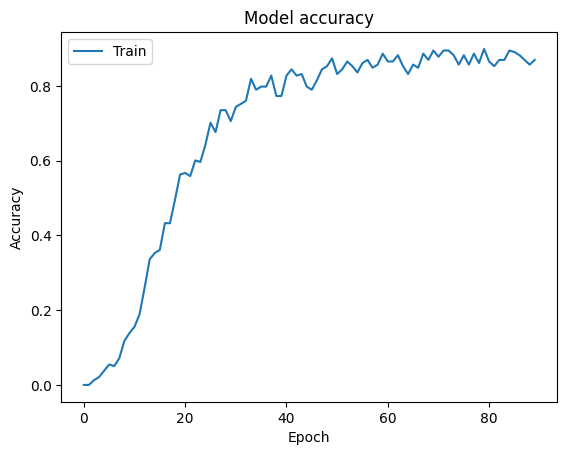

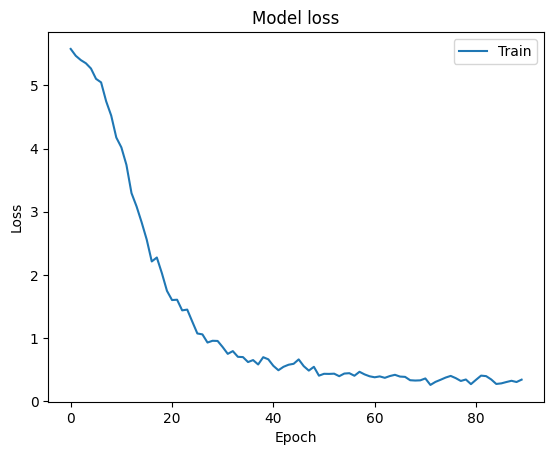

In [3]:
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv2D, BatchNormalization, Normalization, RandomRotation, RandomZoom
from tensorflow.keras.utils import image_dataset_from_directory, img_to_array
from tensorflow.keras.callbacks import LearningRateScheduler
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
import pandas as pd
from tensorflow.keras.applications import VGG16
from os.path import exists
from tensorflow import expand_dims
import os
import matplotlib.pyplot as plt


class Identify_item_model:
    def __init__(self, model_path='./models/identify_item_model.h5', epochs=5, dataset_path='./items'):
        # Initialize class variables
        self.model_path = model_path if (model_path is not None and model_path != '') else './models/identify_item_model.h5'
        self.dataset_path = dataset_path

        # Load or create, train, and save model
        if exists(self.model_path):
            self.load_model()
        else:
            self.num_labels = len(os.listdir(dataset_path))
            self.epochs = epochs
            self.create_model()
            self.train_model()
            self.save_model()
            

    def create_model(self):
        base_model = VGG16(
            weights="imagenet",
            include_top=False,  # No incluir el top model ya que añadiremos el nuestro propio adaptado a nuestro problema
            input_shape=(32, 32, 3),
        )

        
        num_capas_congeladas = 0
        base_model.trainable = True
        for layer in base_model.layers[:len(base_model.layers) - 3]:
            layer.trainable = False
            num_capas_congeladas += 1
        print(f"se han congelado {num_capas_congeladas} capas")

        model = Sequential()

        model.add(base_model)

        # Añadir el top model especifico para la clasificación
        model = self.add_top_model(
            model
        )

        model.compile(
            optimizer=Adam(learning_rate=0.0005),
            loss="categorical_crossentropy",
            metrics=["accuracy"],
        )

        model.summary()

        self.model = model

    def add_top_model(self, model):
    
        model.add(Flatten())
        model.add(Dense(2048, activation="relu"))
        model.add(Dropout(0.3))

        model.add(Dense(512, activation="relu"))
        model.add(Dropout(0.2))

        model.add(Dense(self.num_labels, activation="softmax"))

        return model

    def train_model(self):

        filenames = os.listdir(self.dataset_path)
        labels = [filename.replace('_', ' ').split('.')[0] for filename in filenames]
        data = pd.DataFrame({'filename': filenames, 'label': labels})
        # Load training and validation datasets
        # Image data generator
        train_datagen = ImageDataGenerator(
            rescale=1./255,
            rotation_range=0.2,
            width_shift_range=0.2,
            height_shift_range=0.2,
            shear_range=0.2,
            zoom_range=0.2,
            horizontal_flip=False,
            fill_mode='nearest'
        )

        train_generator = train_datagen.flow_from_dataframe(
            data,
            directory=self.dataset_path,
            x_col='filename',
            y_col='label',
            color_mode='rgb',
            target_size=(32, 32),
            class_mode='categorical',
            batch_size=128
        )

        early_stopping = EarlyStopping(monitor='accuracy', patience=10, restore_best_weights=True)

        # Train the model
        history = self.model.fit(
            train_generator,
            epochs=100,
            callbacks=[early_stopping]
        )

        # Call the function to plot the metrics
        self.plot_metrics(history)

    def save_model(self):
        # Save the trained model to a file
        self.model.save(self.model_path)

    def load_model(self):
        # Load the model from a file
        self.model = load_model(self.model_path)

    def predict(self, image):
        resized = cv2.resize(image, (32, 32)) 
        resized = np.expand_dims(resized, axis=0)

        # Use the predict function to get the probabilities for each class
        probabilities = self.model.predict(resized)

        # Find the index of the class with the highest probability
        max_index = np.argmax(probabilities)

        filenames = os.listdir(self.dataset_path)

        show_image(cv2.cvtColor(cv2.imread(f'{self.dataset_path}/{filenames[max_index]}'), cv2.COLOR_BGR2RGB), small=True)



    def plot_metrics(self, history):
        # Plot training & validation accuracy values
        plt.figure()
        plt.plot(history.history['accuracy'])
        plt.title('Model accuracy')
        plt.ylabel('Accuracy')
        plt.xlabel('Epoch')
        plt.legend(['Train'], loc='upper left')
        plt.show()

        # Plot training & validation loss values
        plt.figure()
        plt.plot(history.history['loss'])
        plt.title('Model loss')
        plt.ylabel('Loss')
        plt.xlabel('Epoch')
        plt.legend(['Train'], loc='upper right')
        plt.show()
    
item_model = Identify_item_model()



In [13]:
import os
import requests

def clean_filename(filename, fallback_name):
    valid_chars = "-_.() %s%s" % (string.ascii_letters, string.digits)
    cleaned_filename = ''.join(c if c in valid_chars else '_' for c in filename)
    if cleaned_filename == '_':
        return fallback_name
    return cleaned_filename

def downloadItems():
    path = './items'
    if not os.path.exists(path):
        os.makedirs(path)
        versions = requests.get('https://ddragon.leagueoflegends.com/api/versions.json')
        champions_array = []
        champions_ids = []
        if(versions.status_code == 200):
            latest_version = versions.json()[0]
            items = requests.get(f'http://ddragon.leagueoflegends.com/cdn/{latest_version}/data/en_US/item.json')
        if(items.status_code == 200):
            items = items.json()
            for itemCode in items['data']:
                clean_item_name = clean_filename(items["data"][itemCode]["name"], f'item_{itemCode}')
                with open(f'./items/{clean_item_name}.jpg', 'wb') as handler:
                    img_data = requests.get(f'http://ddragon.leagueoflegends.com/cdn/{latest_version}/img/item/{itemCode}.png').content
                    img = Image.open(BytesIO(img_data))
                    img = img.resize((32, 32), Image.ANTIALIAS)
                    img_bytes = BytesIO()
                    img.save(img_bytes, format='JPEG')
                    img_bytes.seek(0)
                    handler.write(img_bytes.read())


downloadItems()


75 337
image to search:


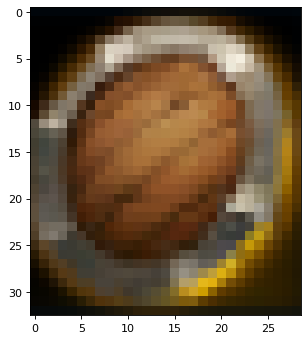

(33, 29, 3)
image predicted:
1/1 [==============================] - 0s 150ms/step


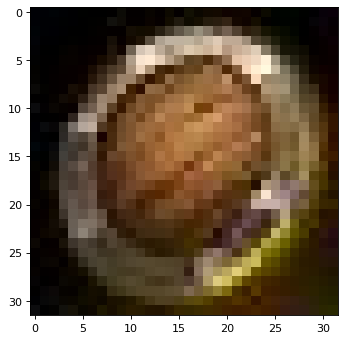

In [14]:
def deleteFarObjects(coords):
    
    finalCoords = []

    for (i, x) in enumerate(coords):
        numImages = 0
        for (y, x2) in enumerate(coords):
            if(y != i):
                if(abs(x - x2) < 50):
                    numImages += 1
                if(numImages == 5):
                    finalCoords.append(x)
                    break
    return finalCoords

def deletePaddingInObjects(image):
    image_enhanced = cv2.equalizeHist(cv2.cvtColor(image, cv2.COLOR_RGB2GRAY))
    thresh = 180
    img_binary = cv2.threshold(image_enhanced, thresh, 255, cv2.THRESH_BINARY)[1]
    #dilate the image vertically to find the diferents parts of the image
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 1))
    image_dilated = cv2.dilate(img_binary, kernel, iterations=200)

    cnts = cv2.findContours(image_dilated, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = cnts[0] if len(cnts) == 2 else cnts[1]
    #delete contours that are not useful for this function

    x, y, w, h = cv2.boundingRect(cnts[0])
    image = image[y-1:y+h+1, :]

    image_enhanced = cv2.equalizeHist(cv2.cvtColor(image, cv2.COLOR_RGB2GRAY))
    thresh = 180
    img_binary = cv2.threshold(image_enhanced, thresh, 255, cv2.THRESH_BINARY)[1]

    #dilate the image vertically to find the diferents parts of the image
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1, 5))
    image_dilated = cv2.dilate(img_binary, kernel, iterations=200)

    cnts = cv2.findContours(image_dilated, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = cnts[0] if len(cnts) == 2 else cnts[1]
    #delete contours that are not useful for this function

    x, y, w, h = cv2.boundingRect(cnts[0])
    image = image[:, x-1:x+w+1, :]

    return image

def getItemsCoords(imgs, x_username, x_kda):
    imgs_cropped = []
    firstItemCoords = []
    lastItemCoords = []

    for img in imgs:
        imgs_cropped.append(img[:, int(x_username * 1.35) : x_kda - 5])


    for img in imgs_cropped:

        #dilate once vertically to avoid small parts
        img = cv2.equalizeHist(cv2.cvtColor(img, cv2.COLOR_RGB2GRAY))
        thresh = 220
        img = cv2.threshold(img, thresh, 255, cv2.THRESH_BINARY)[1]
        kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1, 10))
        img = cv2.dilate(img, kernel, iterations=50)

        #dilate horizontally to avoid small parts
        kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 1))
        img = cv2.dilate(img, kernel, iterations=1)

        cnts = cv2.findContours(img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        cnts = cnts[0] if len(cnts) == 2 else cnts[1]

            #sort from left to right
        cnts = sorted(cnts, key=lambda item1: item1[0][0][0])

        

        if(len(cnts) > 3):
            x, y, w, h = cv2.boundingRect(cnts[2])
            firstItemCoords.append(x)
            x2, y2, w2, h2 = cv2.boundingRect(cnts[-1])
            lastItemCoords.append(x2 + w2)


    firstItemCoords = deleteFarObjects(firstItemCoords)
    lastItemCoords = deleteFarObjects(lastItemCoords)



    
    
    print(int(sum(firstItemCoords) / len(firstItemCoords)), int(sum(lastItemCoords) / len(lastItemCoords)))
    start = int(sum(firstItemCoords) / len(firstItemCoords))
    end = int(sum(lastItemCoords) / len(lastItemCoords))

    # img = preprocessImg(img)


    img = deletePaddingInObjects(imgs_cropped[0][:, start : int(start + ((end - start) / 7))])
    print("image to search:")
    show_image(img, small=True)
    print(img.shape)
    print("image predicted:")
    item_model.predict(img)


getItemsCoords(player_images, x_username+w_username, x_kda - 5)
